# MORPHE-MU Contrast adjustment

## Setup imports and notebook

In [1]:
%matplotlib notebook

In [171]:
import tensorflow as tf
import pykitti as pk
import skimage
import skimage.color
import skimage.transform as sktr
import skimage.morphology
import skimage.draw
import skimage.segmentation
import skimage.feature
import skimage.exposure
import numpy as np
import scipy
from matplotlib import pyplot as plt
import matplotlib.colors

## Import datasets

In [3]:
basedir = '/Users/morpheby/Downloads/data/'
date = '2011_09_26'
drive = '0009'

# The range argument is optional - default is None, which loads the whole dataset
data = pk.raw(basedir, date, drive, range(383,384))

data.load_rgb()
cam2_image = data.rgb[0].left


Loading color images from 2011_09_26_drive_0009_sync...
Found 1 image pairs...
done.


In [4]:
img = np.array(data.rgb[0].left)

## Original image

<IPython.core.display.Javascript object>


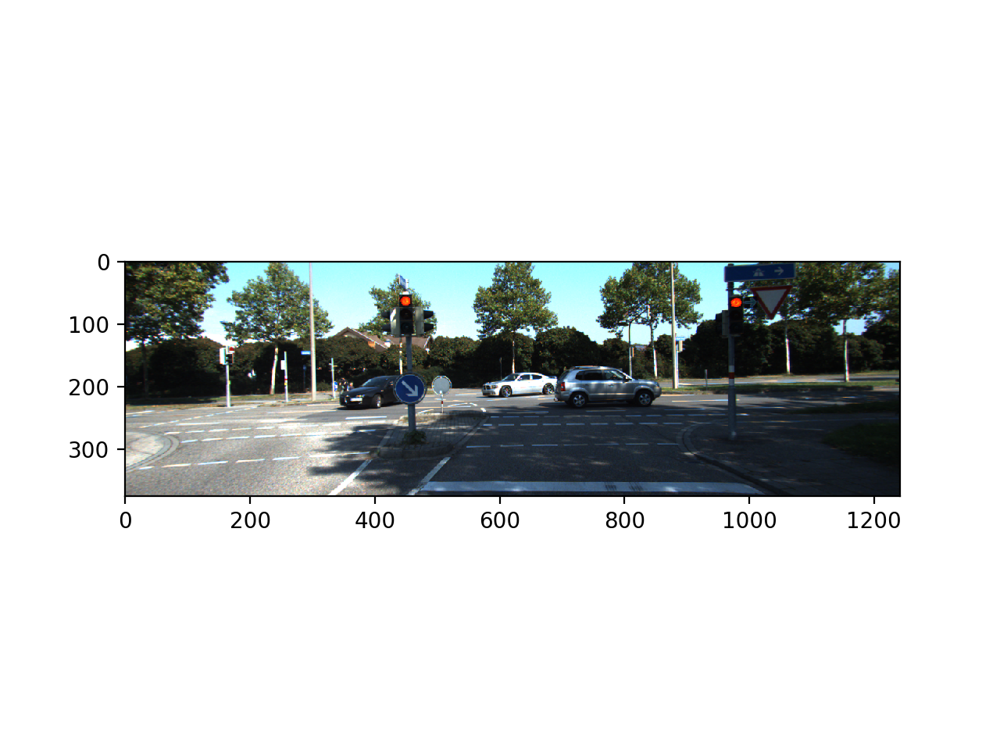

In [5]:
fig1 = plt.figure()
ax = fig1.add_subplot(1, 1, 1)

In [6]:
ax.clear();
ax.imshow(img);

## Lab colorspace transformation

In [7]:
new = skimage.color.rgb2luv(img)

<IPython.core.display.Javascript object>


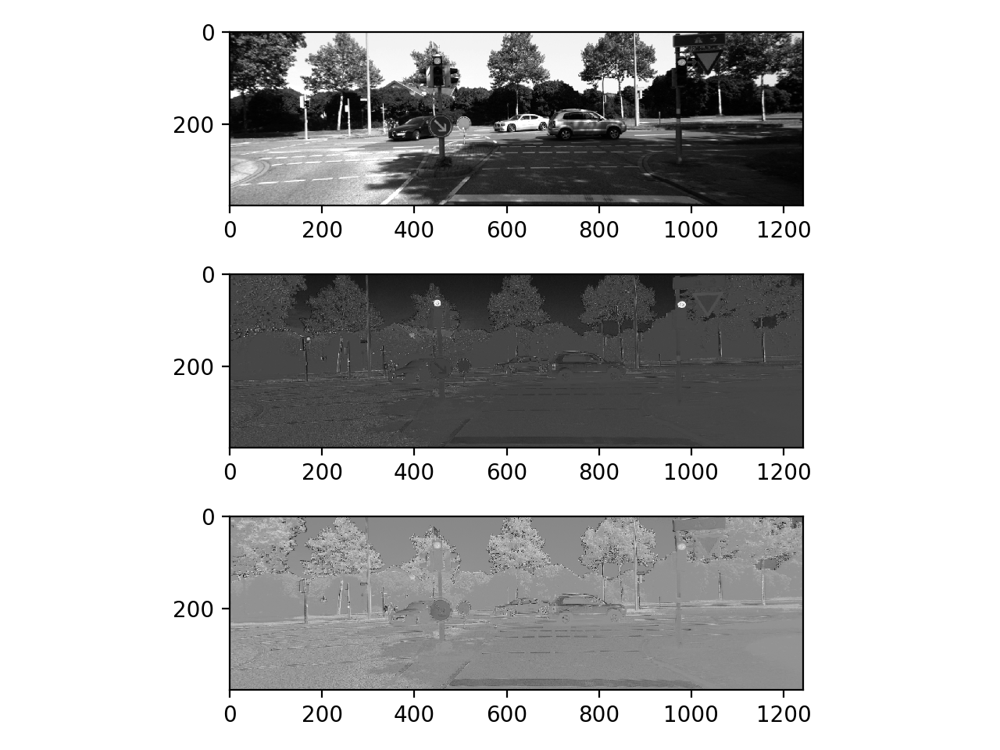

In [8]:
fig2 = plt.figure()
axL = fig2.add_subplot(3, 1, 1)
axU = fig2.add_subplot(3, 1, 2)
axV = fig2.add_subplot(3, 1, 3)
fig2.tight_layout()

In [221]:
L = np.dot(new, np.array([0.01, 0, 0]))
U = np.dot(new, np.array([0, 0.01, 0]))
V = np.dot(new, np.array([0, 0, 0.01]))
print(L.shape); print(U.shape); print(V.shape)

axL.clear(); axU.clear(); axV.clear();
axL.imshow(L, cmap='gray');
axU.imshow(U, cmap='gray');
axV.imshow(V, cmap='gray');

(375, 1242)
(375, 1242)
(375, 1242)


## Downsampling attempts

<IPython.core.display.Javascript object>


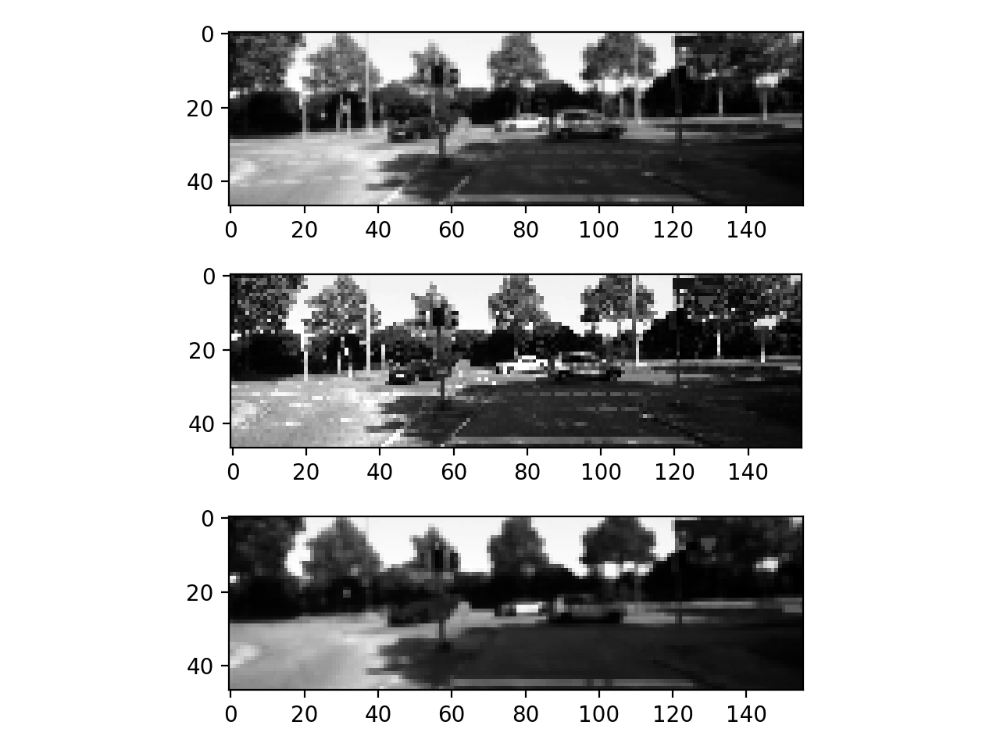

In [10]:
fig3 = plt.figure()
ax_down1 = fig3.add_subplot(3, 1, 1)
ax_down2 = fig3.add_subplot(3, 1, 2)
ax_down3 = fig3.add_subplot(3, 1, 3)
fig3.tight_layout()

In [11]:
L_down1 = sktr.pyramid_reduce(L, 8.0, multichannel=False)
L_down2 = sktr.rescale(L, 1/8.0, multichannel=False)
L_down3 = sktr.pyramid_reduce(skimage.morphology.opening(L, skimage.morphology.square(10)), 8.0, multichannel=False)
# use opening or closing in propotion to region size by segmentation

/Users/morpheby/workspace/py-venvs/morphe-mu/lib/python3.6/site-packages/skimage/transform/_warps.py:97: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


In [12]:
ax_down1.clear(); ax_down2.clear(); ax_down3.clear();
ax_down1.imshow(L_down1, cmap='gray');
ax_down2.imshow(L_down2, cmap='gray');
ax_down3.imshow(L_down3, cmap='gray');

As can be seen, image data loses a lot of detail after downsampling.

We are going to find a way to higher contrast in the areas with smaller features and lessen contrast in areas with bigger features.

## Segmentation

### Try using *Active Snakes*

<IPython.core.display.Javascript object>


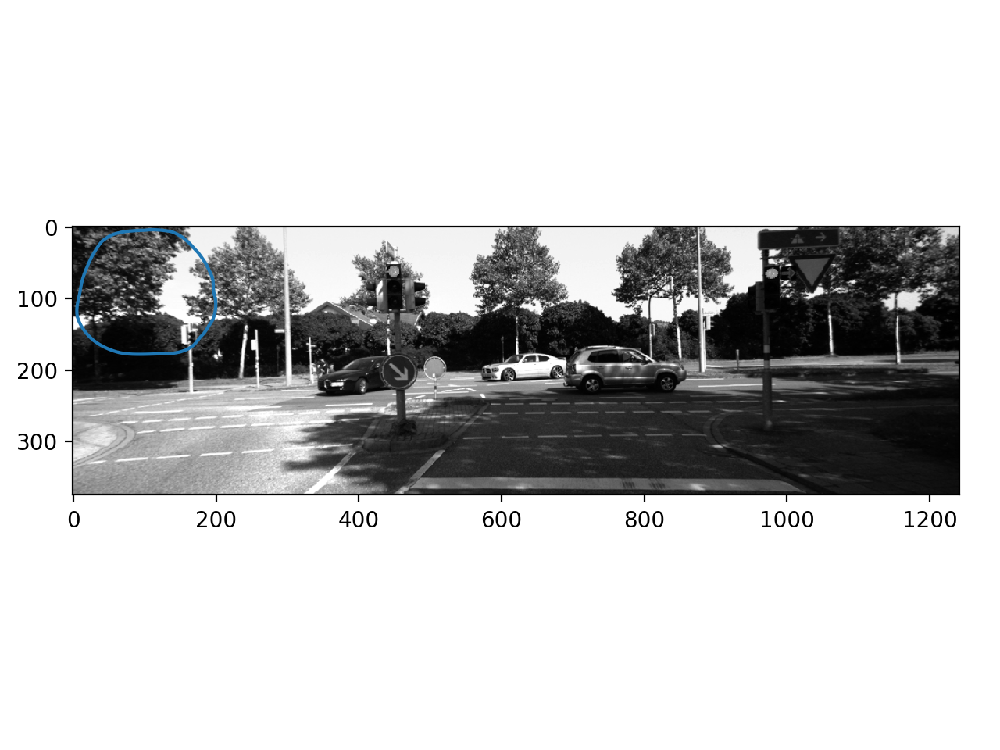

In [13]:
fig4 = plt.figure()
ax_snake = fig4.add_subplot(1, 1, 1)
fig4.tight_layout()

In [14]:
from skimage.draw import circle_perimeter
from skimage.filters import gaussian

s = np.linspace(0, 2*np.pi,100)
init = 100*np.array([np.cos(s), np.sin(s)]).T+100

snake = skimage.segmentation.active_contour(L, init, w_edge=1, w_line=0, bc='periodic') 


In [15]:
ax_snake.clear();
ax_snake.plot(np.dot(snake, np.array([1, 0])), np.dot(snake, np.array([0, 1])));
# ax_snake.plot(np.dot(init, np.array([1, 0])), np.dot(init, np.array([0, 1])));
ax_snake.imshow(L, cmap='gray');

The results are not very promising and running time is too big.

### Chan Vese segmentation

<IPython.core.display.Javascript object>


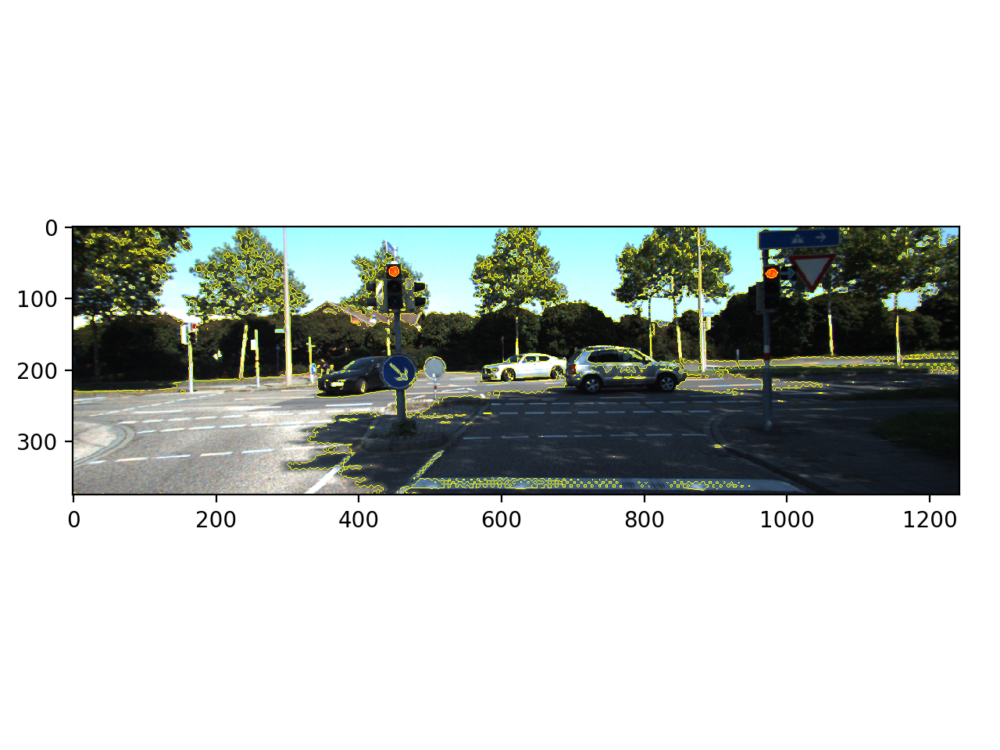

In [16]:
fig5 = plt.figure()
ax_chanvese = fig5.add_subplot(1, 1, 1)
fig5.tight_layout()

In [17]:
segms_chv = skimage.segmentation.chan_vese(L, max_iter = 25)

In [18]:
ax_chanvese.clear()
ax_chanvese.imshow(skimage.segmentation.mark_boundaries(img, segms_chv));

Too slow to be meaningful.

### Felsenszwalb’s segmentation

<IPython.core.display.Javascript object>


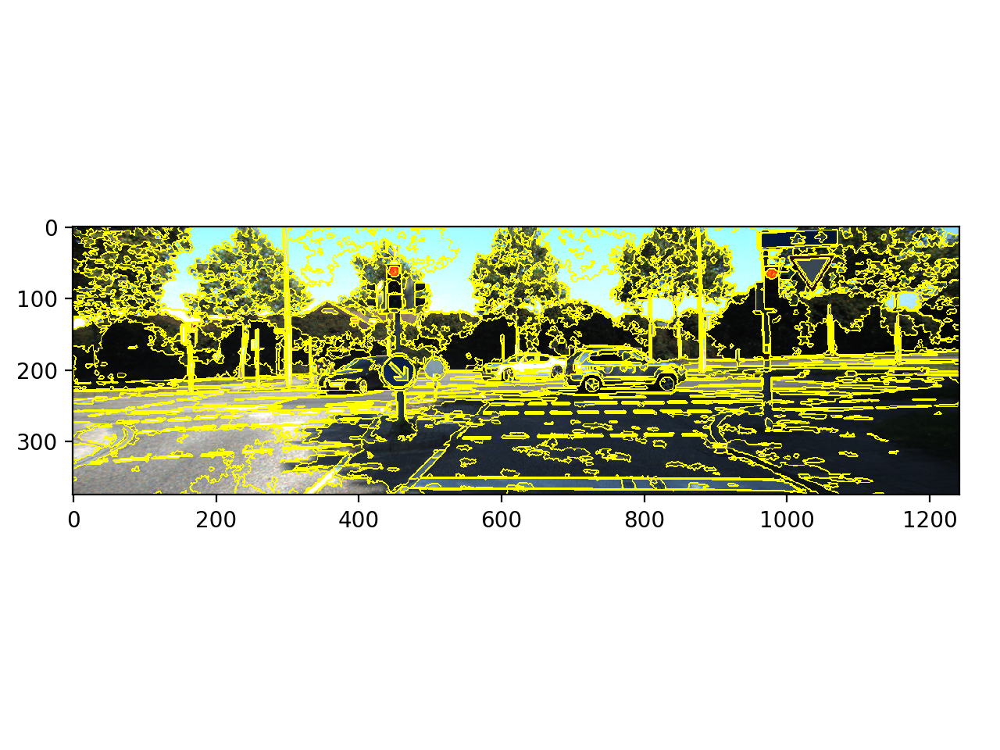

In [19]:
fig6 = plt.figure()
ax_fzw = fig6.add_subplot(1, 1, 1)
fig6.tight_layout()

In [20]:
segms_fzw = skimage.segmentation.felzenszwalb(L, scale = 100.0, sigma = 0.3)

In [21]:
ax_fzw.clear()
ax_fzw.imshow(skimage.segmentation.mark_boundaries(img, segms_fzw));

Should consider later... seems fine

### quickshift segmentation

<IPython.core.display.Javascript object>


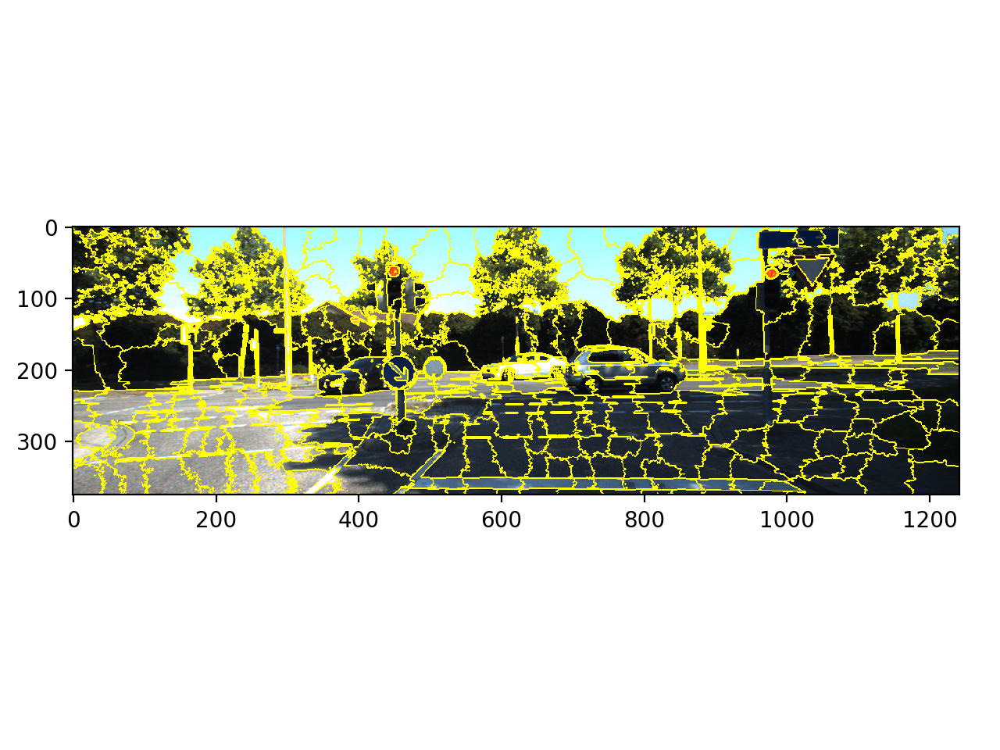

In [22]:
fig7 = plt.figure()
ax_qs = fig7.add_subplot(1, 1, 1)
fig7.tight_layout()

In [23]:
segms_qs = skimage.segmentation.quickshift(new, convert2lab=False, ratio=0.8, max_dist=20, sigma=0.3, kernel_size=5)

In [24]:
ax_qs.clear()
ax_qs.imshow(skimage.segmentation.mark_boundaries(img, segms_qs));

Slow but feasible

### watershed segmentation

<IPython.core.display.Javascript object>


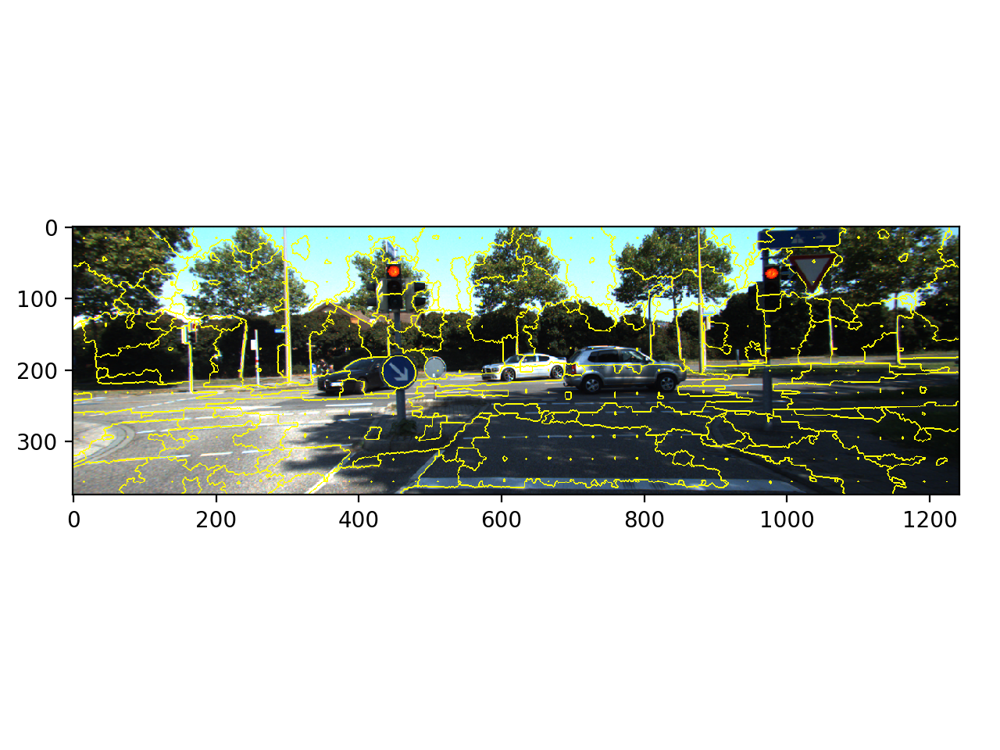

In [25]:
fig8 = plt.figure()
ax_rw = fig8.add_subplot(1, 1, 1)
fig8.tight_layout()

In [26]:


segms_rw = skimage.segmentation.watershed(L, 500, compactness = 0)

In [27]:
ax_rw.clear()
ax_rw.imshow(skimage.segmentation.mark_boundaries(img, segms_rw));

Not really useful

### k-means segmentation

<IPython.core.display.Javascript object>


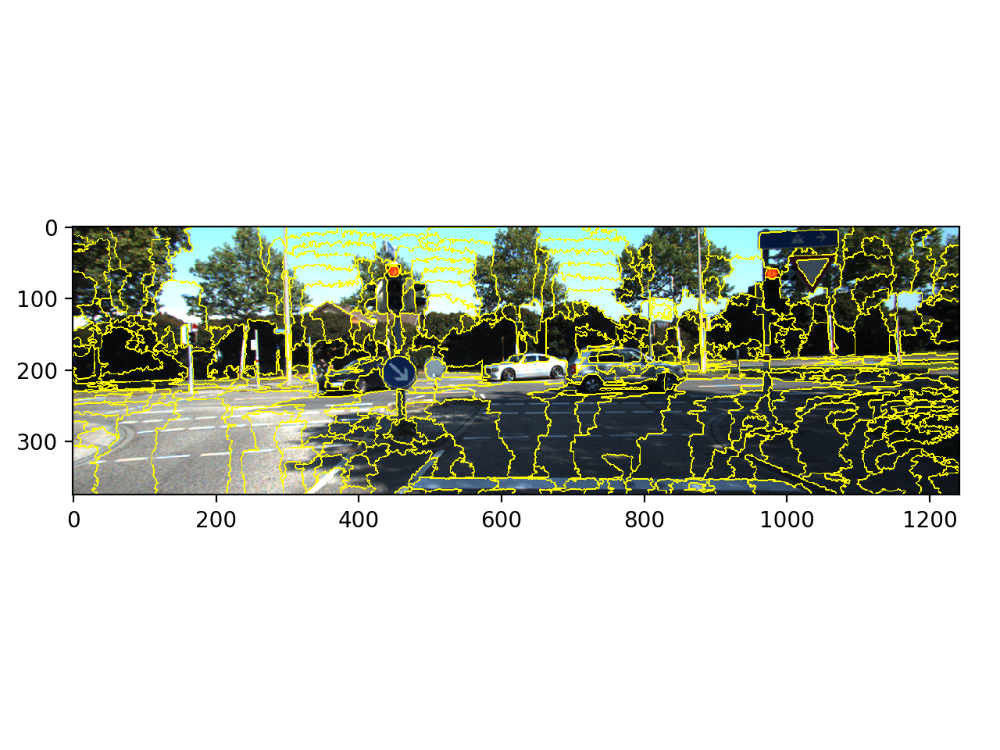

In [28]:
fig9 = plt.figure()
ax_km = fig9.add_subplot(1, 1, 1)
fig9.tight_layout()

In [29]:
segms_km = skimage.segmentation.slic(new, n_segments=500, compactness=0.01, max_iter=10, sigma=0.3, multichannel=True, convert2lab=False, enforce_connectivity=True, min_size_factor=0.1, max_size_factor=5, slic_zero=False)


In [30]:
ax_km.clear()
ax_km.imshow(skimage.segmentation.mark_boundaries(img, segms_km));

Very bad results — makes no sense to us.

## Gradients and feature extraction

<IPython.core.display.Javascript object>


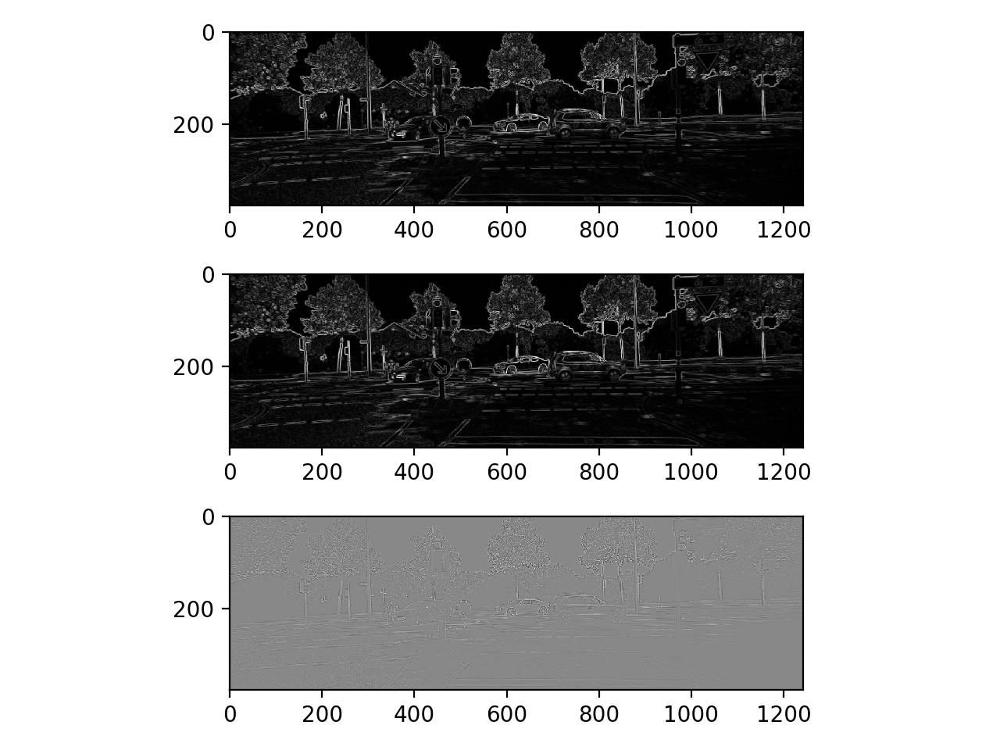

In [59]:
fig10 = plt.figure()
ax_grad1 = fig10.add_subplot(3, 1, 1)
ax_grad2 = fig10.add_subplot(3, 1, 2)
ax_grad3 = fig10.add_subplot(3, 1, 3)
fig10.tight_layout()

In [710]:
grad1 = skimage.filters.sobel(L)
grad2 = skimage.filters.prewitt(L)
grad3 = skimage.filters.laplace(L)

init = np.zeros((10,10))
init[skimage.draw.circle(5, 5, 4)] = 1
# grad1 = skimage.morphology.closing(grad1, init)
# grad2 = skimage.morphology.closing(grad2, init)
# grad3 = skimage.morphology.closing(grad3, init)

In [711]:
ax_grad1.clear(); ax_grad2.clear(); ax_grad3.clear();
ax_grad1.imshow(grad1, cmap='gray');
ax_grad2.imshow(grad2, cmap='gray');
ax_grad3.imshow(grad3, cmap='gray');

Sobel works pretty well.

### Sobel edge highlighting

<IPython.core.display.Javascript object>


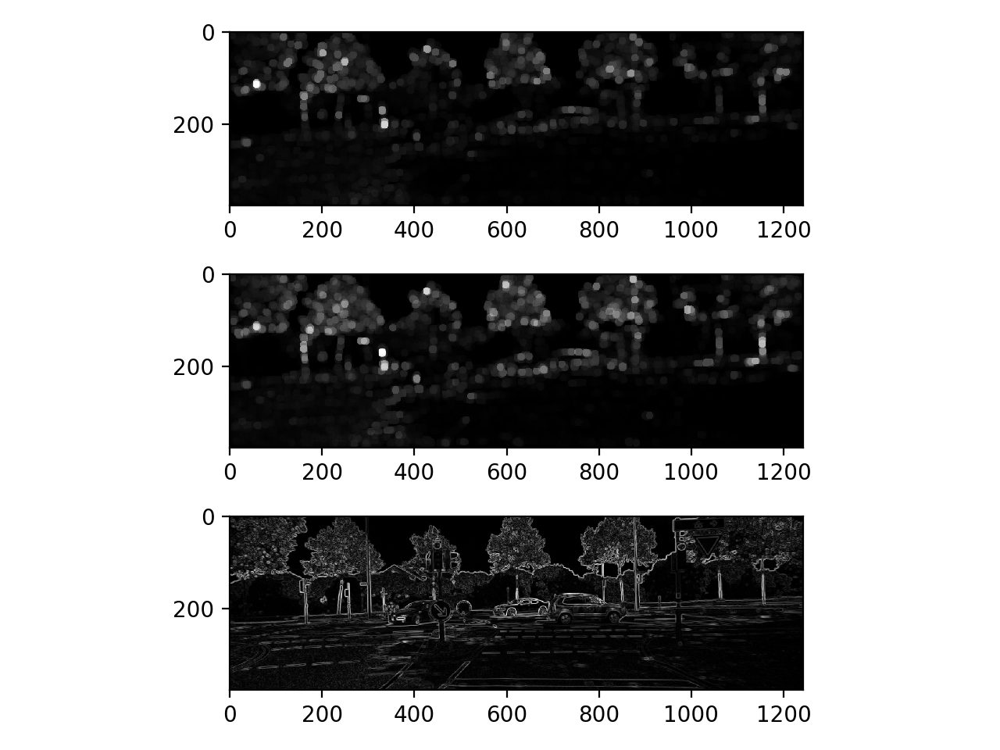

In [162]:
fig11 = plt.figure()
ax_highlight1 = fig11.add_subplot(3, 1, 1)
ax_highlight2 = fig11.add_subplot(3, 1, 2)
ax_highlight3 = fig11.add_subplot(3, 1, 3)
fig11.tight_layout()

In [767]:
grad_L = skimage.filters.sobel(L)
grad_U = skimage.filters.sobel(U)
grad_V = skimage.filters.sobel(V)

init1 = np.zeros((20,20))
init1[skimage.draw.circle(10, 10, 5)] = 1
init2 = np.zeros((20,20))
init2[skimage.draw.circle(10, 10, 8)] = 1
def m_closing(img, s1, s2):
#     return skimage.morphology.erosion(skimage.morphology.dilation(img, s1), s2)
    return skimage.morphology.dilation(1*skimage.morphology.erosion(img, s1)**1.9, s2)
#     return skimage.filters.gaussian(img, sigma=3)
#     return img

grad_LUV1 = np.sqrt(m_closing(grad_L, init1, init2)**2 + \
            m_closing(grad_U, init1, init2)**2 + \
            m_closing(grad_V, init1, init2)**2)

grad_LUV2 = m_closing(grad_L, init1, init2)**1.0 + \
            0.3*m_closing(grad_U, init1, init2)**1.0 + \
            0.3*m_closing(grad_V, init1, init2)**1.0

In [768]:
ax_highlight1.clear(); ax_highlight2.clear(); ax_highlight3.clear();
ax_highlight1.imshow(grad_LUV1, cmap='gray');
ax_highlight2.imshow(grad_LUV2, cmap='gray');
ax_highlight3.imshow(grad1, cmap='gray');

No significant difference between Euclidian distance and sum. Sum is obviously faster. Choosing sum.

In [769]:
grad_LUV = skimage.filters.gaussian(grad_LUV2, sigma = 1.)
grad_LUV = grad_LUV / np.max(grad_LUV)
(np.min(grad_LUV), np.max(grad_LUV), np.median(grad_LUV), np.average(grad_LUV))

(2.6249914765426567e-07, 1.0, 0.026404523885701543, 0.066141452855390415)

## Contrast adjustment

<IPython.core.display.Javascript object>


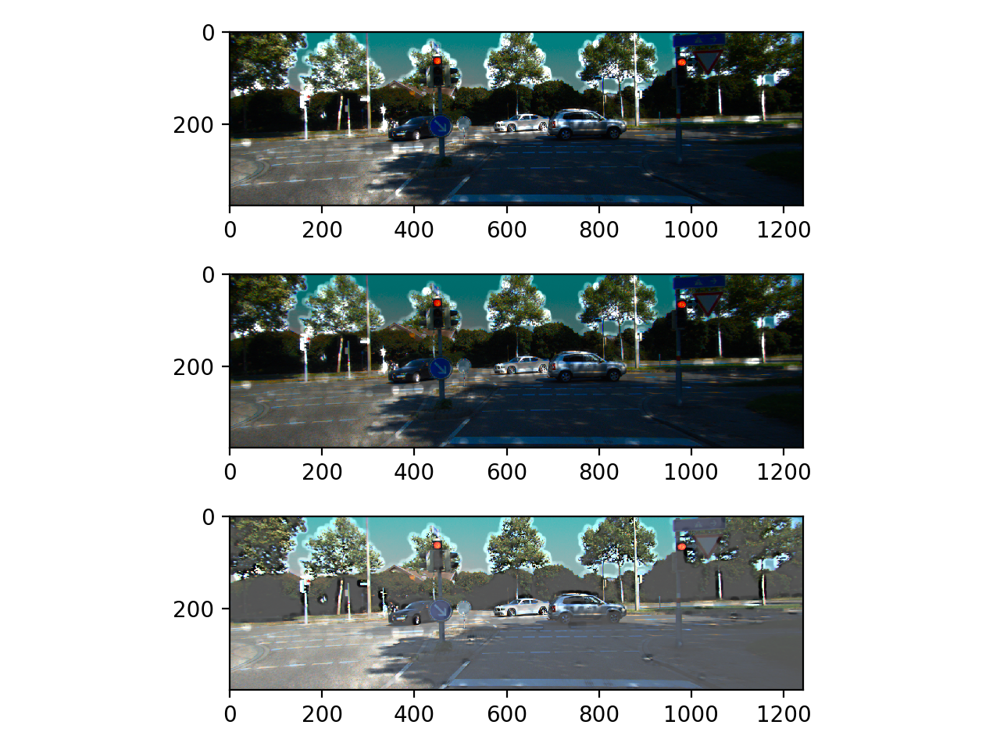

In [412]:
fig12 = plt.figure()
ax_contrast1 = fig12.add_subplot(3, 1, 1)
ax_contrast2 = fig12.add_subplot(3, 1, 2)
ax_contrast3 = fig12.add_subplot(3, 1, 3)
fig12.tight_layout()

In [791]:
L1 = L * (3*grad_LUV+0.5)
print(L1.shape)
    
L2 = np.log(1 + L) * (3*grad_LUV + 0.6)
print(L2.shape)

L3 = 1 / ( 1 + np.exp(1 * (22*grad_LUV+1.5) * (0.4 - L)))
print(L3.shape)

(375, 1242)
(375, 1242)
(375, 1242)


In [792]:
adjusted_luv1 = 100*np.stack((L1, U, V), axis = 2)
adjusted1 = skimage.color.luv2rgb(adjusted_luv1)

adjusted_luv2 = 100*np.stack((L2, U, V), axis = 2)
adjusted2 = skimage.color.luv2rgb(adjusted_luv2)

adjusted_luv3 = 100*np.stack((L3, U, V), axis = 2)
adjusted3 = skimage.color.luv2rgb(adjusted_luv3)

In [794]:
ax_contrast1.clear(); ax_contrast3.clear(); ax_contrast3.clear();
ax_contrast1.imshow(adjusted1);
ax_contrast2.imshow(adjusted2);
ax_contrast3.imshow(adjusted3);

<IPython.core.display.Javascript object>


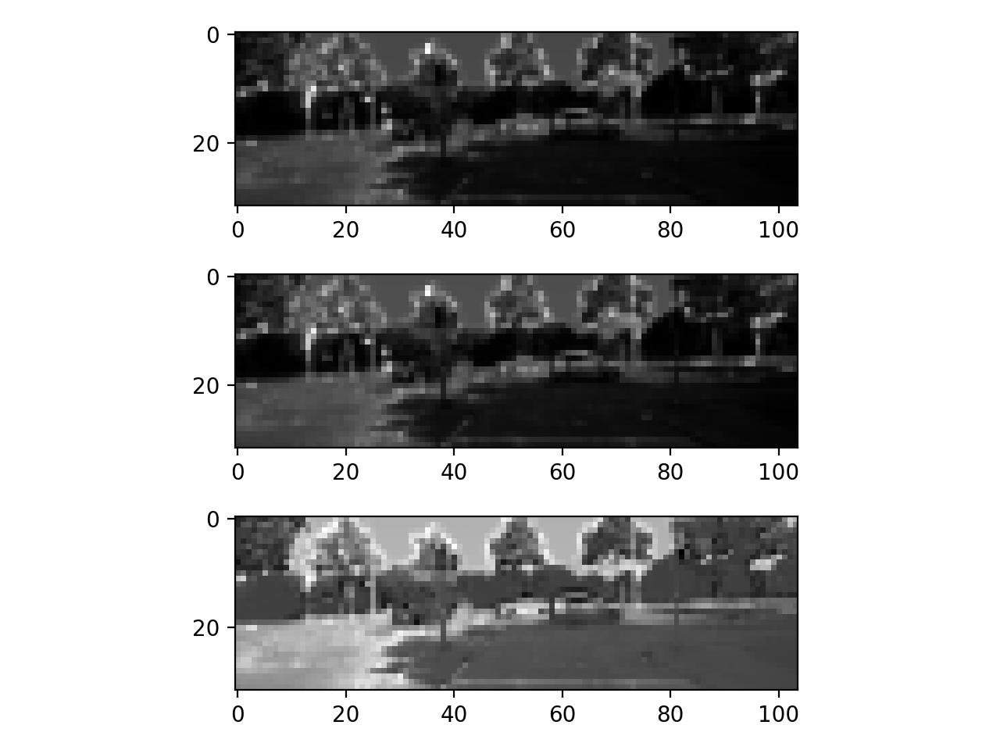

In [795]:
fig13 = plt.figure()
ax_adown1 = fig13.add_subplot(3, 1, 1)
ax_adown2 = fig13.add_subplot(3, 1, 2)
ax_adown3 = fig13.add_subplot(3, 1, 3)
fig13.tight_layout()

In [796]:
L_adown1 = sktr.pyramid_reduce(L1, 12.0, multichannel=False)
L_adown2 = sktr.pyramid_reduce(L2, 12.0, multichannel=False)
L_adown3 = sktr.pyramid_reduce(L3, 12.0, multichannel=False)

In [797]:
ax_adown1.clear(); ax_adown2.clear(); ax_adown3.clear();
ax_adown1.imshow(L_adown1, cmap='gray');
ax_adown2.imshow(L_adown2, cmap='gray');
ax_adown3.imshow(L_adown3, cmap='gray');

The last one seems to highly improve visibility on downsampled images.

In [785]:
L_adj = L3
img_adjusted = adjusted3
LUV_adjusted = adjusted_luv3

<IPython.core.display.Javascript object>


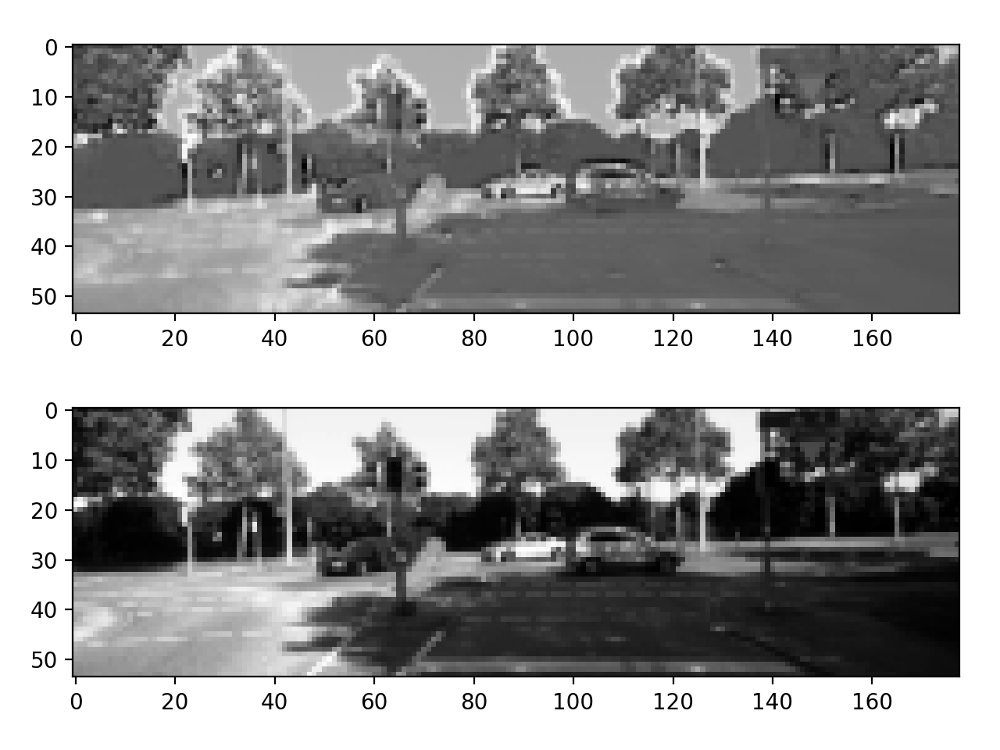

In [528]:
fig14 = plt.figure()
ax_adown1_cmp = fig14.add_subplot(2, 1, 1)
ax_adown2_cmp = fig14.add_subplot(2, 1, 2)
fig14.tight_layout()

In [798]:
L_adown1_cmp = sktr.pyramid_reduce(L_adj, 7.0, multichannel=False)
L_adown2_cmp = sktr.pyramid_reduce(L, 7.0, multichannel=False)

In [799]:
ax_adown1_cmp.clear(); ax_adown2_cmp.clear();
ax_adown1_cmp.imshow(L_adown1_cmp, cmap='gray');
ax_adown2_cmp.imshow(L_adown2_cmp, cmap='gray');

## Results

In [812]:
import preprocess_img

<IPython.core.display.Javascript object>


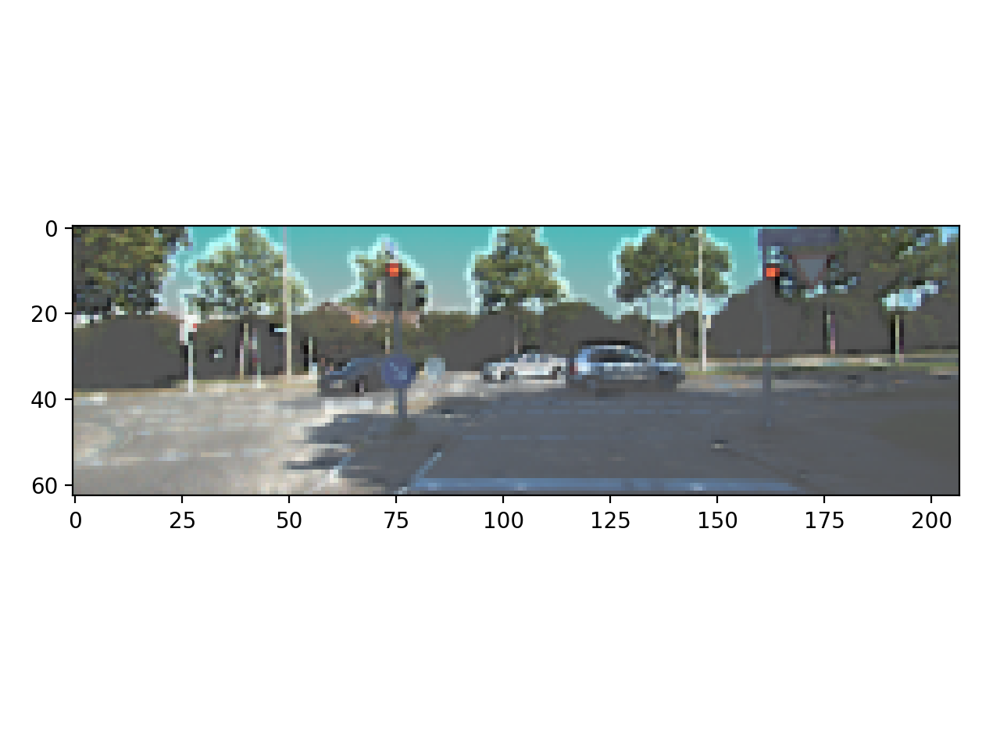

In [820]:
fig15 = plt.figure()
ax_result = fig15.add_subplot(1, 1, 1)
fig15.tight_layout()

In [822]:
ax_result.clear();

pp_luv = preprocess_img.make_luv(img)
pp_contr_L = preprocess_img.higher_contrast(*pp_luv)
pp_rgb = preprocess_img.make_rgb(pp_contr_L, pp_luv[1], pp_luv[2])

ax_result.imshow(preprocess_img.downsample(pp_rgb, 6));